In [ ]:
# !dir

In [ ]:
# ! pip install -r requirements.txt

In [1]:
import functools
import os

from matplotlib import gridspec
import matplotlib.pylab as plt
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub

print("TF Version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)
print("Eager mode enabled: ", tf.executing_eagerly())
print("GPU available: ", tf.config.list_physical_devices('GPU'))


TF Version:  2.19.0
TF Hub version:  0.16.1
Eager mode enabled:  True
GPU available:  []


In [ ]:
!nvidia-smi

Sat May 17 18:24:25 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 576.02                 Driver Version: 576.02         CUDA Version: 12.9     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                  Driver-Model | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 3050 ...  WDDM  |   00000000:01:00.0 Off |                  N/A |
| N/A   42C    P8              5W /   30W |       0MiB /   4096MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!mkdir input_images output_images

In [2]:
import os

input_images = 'input_images'
output_images='output_images/printing_image'
os.makedirs(input_images, exist_ok=True)
os.makedirs(output_images, exist_ok=True)

In [3]:
#Define image loading and visualization functions

# @title Define image loading and visualization functions  { display-mode: "form" }

@functools.lru_cache(maxsize=None)
def load_image_url(image_url, image_size=(256, 256), preserve_aspect_ratio=True):
  """Loads and preprocesses images."""

  # Cache image file locally.
  image_path = tf.keras.utils.get_file(os.path.basename(image_url)[-128:], image_url)

  # Load and convert to float32 numpy array, add batch dimension, and normalize to range [0, 1].
  img = tf.io.decode_image(
      tf.io.read_file(image_path),
      channels=3, dtype=tf.float32)[tf.newaxis, ...]

  img = tf.image.resize(img, image_size, preserve_aspect_ratio=True)
  return img

def show_n(images, titles=('',)):
  n = len(images)
  image_sizes = [image.shape[1] for image in images]
  w = (image_sizes[0] * 6) // 320
  plt.figure(figsize=(w * n, w))
  gs = gridspec.GridSpec(1, n, width_ratios=image_sizes)
  for i in range(n):
    plt.subplot(gs[i])
    plt.imshow(images[i][0], aspect='equal')
    plt.axis('off')
    plt.title(titles[i] if len(titles) > i else '')
  plt.show()


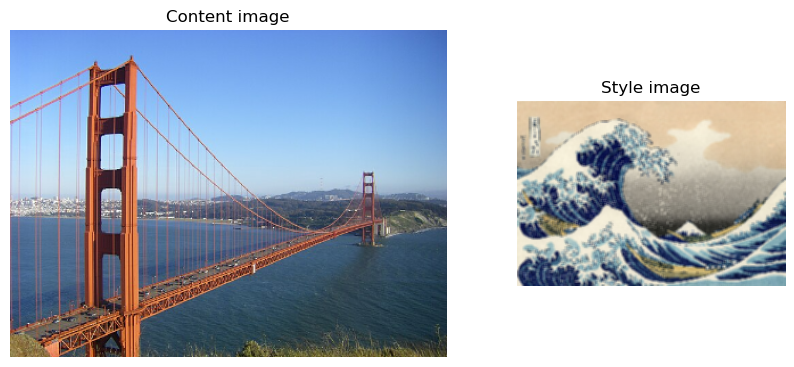

In [4]:
# @title Load example images  { display-mode: "form" }

content_image_url = 'https://upload.wikimedia.org/wikipedia/commons/thumb/f/fd/Golden_Gate_Bridge_from_Battery_Spencer.jpg/640px-Golden_Gate_Bridge_from_Battery_Spencer.jpg'  # @param {type:"string"}
style_image_url = 'https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg'  # @param {type:"string"}
output_image_size = 384  # @param {type:"integer"}

# The content image size can be arbitrary.
content_img_size = (output_image_size, output_image_size)
# The style prediction model was trained with image size 256 and it's the
# recommended image size for the style image (though, other sizes work as
# well but will lead to different results).
style_img_size = (256, 256)  # Recommended to keep it at 256.

content_image = load_image_url(content_image_url, content_img_size)
style_image = load_image_url(style_image_url, style_img_size)

with tf.device('/CPU:0'):
    style_image = tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME')

show_n([content_image, style_image], ['Content image', 'Style image'])

In [5]:
# Load TF Hub module.

hub_handle = 'https://tfhub.dev/google/magenta/arbitrary-image-stylization-v1-256/2'
hub_module = hub.load(hub_handle)

In [6]:
# Stylize content image with given style image.
# This is pretty fast within a few milliseconds on a GPU.

with tf.device('/GPU:0' if tf.config.list_physical_devices('GPU') else '/CPU:0'):
    # Call the hub module with the content and style images as tensors
    outputs = hub_module(tf.constant(content_image), tf.constant(style_image))
    stylized_image = outputs[0]

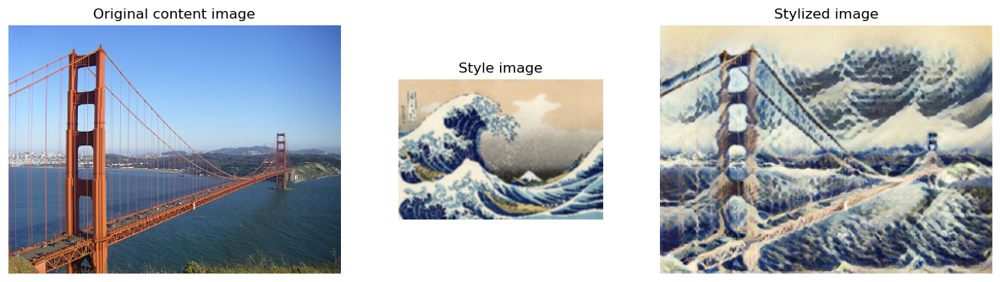

In [7]:
# Visualize input images and the generated stylized image.

show_n([content_image, style_image, stylized_image], titles=['Original content image', 'Style image', 'Stylized image'])

In [8]:
# @title To Run: Load more images { display-mode: "form" }

content_urls = dict(
  sea_turtle='https://upload.wikimedia.org/wikipedia/commons/d/d7/Green_Sea_Turtle_grazing_seagrass.jpg',
  tuebingen='https://upload.wikimedia.org/wikipedia/commons/0/00/Tuebingen_Neckarfront.jpg',
  grace_hopper='https://storage.googleapis.com/download.tensorflow.org/example_images/grace_hopper.jpg',
  )
style_urls = dict(
  kanagawa_great_wave='https://upload.wikimedia.org/wikipedia/commons/0/0a/The_Great_Wave_off_Kanagawa.jpg',
  kandinsky_composition_7='https://upload.wikimedia.org/wikipedia/commons/b/b4/Vassily_Kandinsky%2C_1913_-_Composition_7.jpg',
  hubble_pillars_of_creation='https://upload.wikimedia.org/wikipedia/commons/6/68/Pillars_of_creation_2014_HST_WFC3-UVIS_full-res_denoised.jpg',
  van_gogh_starry_night='https://upload.wikimedia.org/wikipedia/commons/thumb/e/ea/Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg/1024px-Van_Gogh_-_Starry_Night_-_Google_Art_Project.jpg',
  turner_nantes='https://upload.wikimedia.org/wikipedia/commons/b/b7/JMW_Turner_-_Nantes_from_the_Ile_Feydeau.jpg',
  munch_scream='https://upload.wikimedia.org/wikipedia/commons/c/c5/Edvard_Munch%2C_1893%2C_The_Scream%2C_oil%2C_tempera_and_pastel_on_cardboard%2C_91_x_73_cm%2C_National_Gallery_of_Norway.jpg',
  picasso_demoiselles_avignon='https://upload.wikimedia.org/wikipedia/en/4/4c/Les_Demoiselles_d%27Avignon.jpg',
  picasso_violin='https://upload.wikimedia.org/wikipedia/en/3/3c/Pablo_Picasso%2C_1911-12%2C_Violon_%28Violin%29%2C_oil_on_canvas%2C_Kr%C3%B6ller-M%C3%BCller_Museum%2C_Otterlo%2C_Netherlands.jpg',
  picasso_bottle_of_rum='https://upload.wikimedia.org/wikipedia/en/7/7f/Pablo_Picasso%2C_1911%2C_Still_Life_with_a_Bottle_of_Rum%2C_oil_on_canvas%2C_61.3_x_50.5_cm%2C_Metropolitan_Museum_of_Art%2C_New_York.jpg',
  fire='https://upload.wikimedia.org/wikipedia/commons/3/36/Large_bonfire.jpg',
  derkovits_woman_head='https://upload.wikimedia.org/wikipedia/commons/0/0d/Derkovits_Gyula_Woman_head_1922.jpg',
  amadeo_style_life='https://upload.wikimedia.org/wikipedia/commons/8/8e/Untitled_%28Still_life%29_%281913%29_-_Amadeo_Souza-Cardoso_%281887-1918%29_%2817385824283%29.jpg',
  derkovtis_talig='https://upload.wikimedia.org/wikipedia/commons/3/37/Derkovits_Gyula_Talig%C3%A1s_1920.jpg',
  amadeo_cardoso='https://upload.wikimedia.org/wikipedia/commons/7/7d/Amadeo_de_Souza-Cardoso%2C_1915_-_Landscape_with_black_figure.jpg'
)

content_image_size = 384
style_image_size = 256
content_images = {k: load_image_url(v, (content_image_size, content_image_size)) for k, v in content_urls.items()}
style_images = {k: load_image_url(v, (style_image_size, style_image_size)) for k, v in style_urls.items()}
style_images = {k: tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME') for k, style_image in style_images.items()}


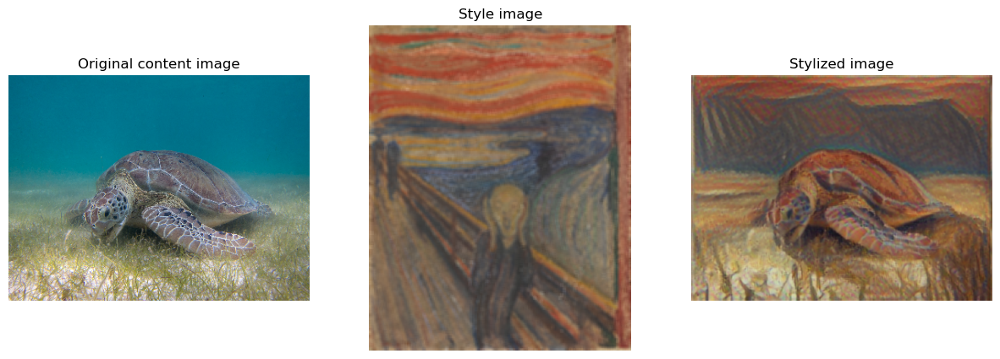

In [9]:
#@title Specify the main content image and the style you want to use.  { display-mode: "form" }

content_name = 'sea_turtle'  # @param ['sea_turtle', 'tuebingen', 'grace_hopper']
style_name = 'munch_scream'  # @param ['kanagawa_great_wave', 'kandinsky_composition_7', 'hubble_pillars_of_creation', 'van_gogh_starry_night', 'turner_nantes', 'munch_scream', 'picasso_demoiselles_avignon', 'picasso_violin', 'picasso_bottle_of_rum', 'fire', 'derkovits_woman_head', 'amadeo_style_life', 'derkovtis_talig', 'amadeo_cardoso']

stylized_image = hub_module(tf.constant(content_images[content_name]),
                            tf.constant(style_images[style_name]))[0]

show_n([content_images[content_name], style_images[style_name], stylized_image],
       titles=['Original content image', 'Style image', 'Stylized image'])

In [10]:
import torch
from PIL import Image
import numpy as np
from RealESRGAN import RealESRGAN

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = RealESRGAN(device, scale=4)
model.load_weights('weights/RealESRGAN_x4.pth', download=True)


C:\Users\ubaid\AppData\Roaming\Python\Python312\site-packages\RealESRGAN\model.py:59: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  @torch.cuda.amp.autocast()
C:\Users\ubaid\AppData\Roaming\Python\Python312\site-packages\torch\amp\autocast_mode.py:266: UserWarning: User provided device_type of 'cuda', but CUDA is not available. Disabling
  warnings.warn(
C:\Users\ubaid\AppData\Roaming\Python\Python312\site-packages\huggingface_hub\file_download.py:649: FutureWarning: 'cached_download' is the legacy way to download files from the HF hub, please consider upgrading to 'hf_hub_download'
  warnings.warn(


Weights downloaded to: weights\RealESRGAN_x4.pth


In [11]:
path_to_image = 'input_images/sample.jpg'
image = Image.open(path_to_image).convert('RGB')

In [12]:
sr_image = model.predict(image)


sr_image.save('output_images/sr_image.png')

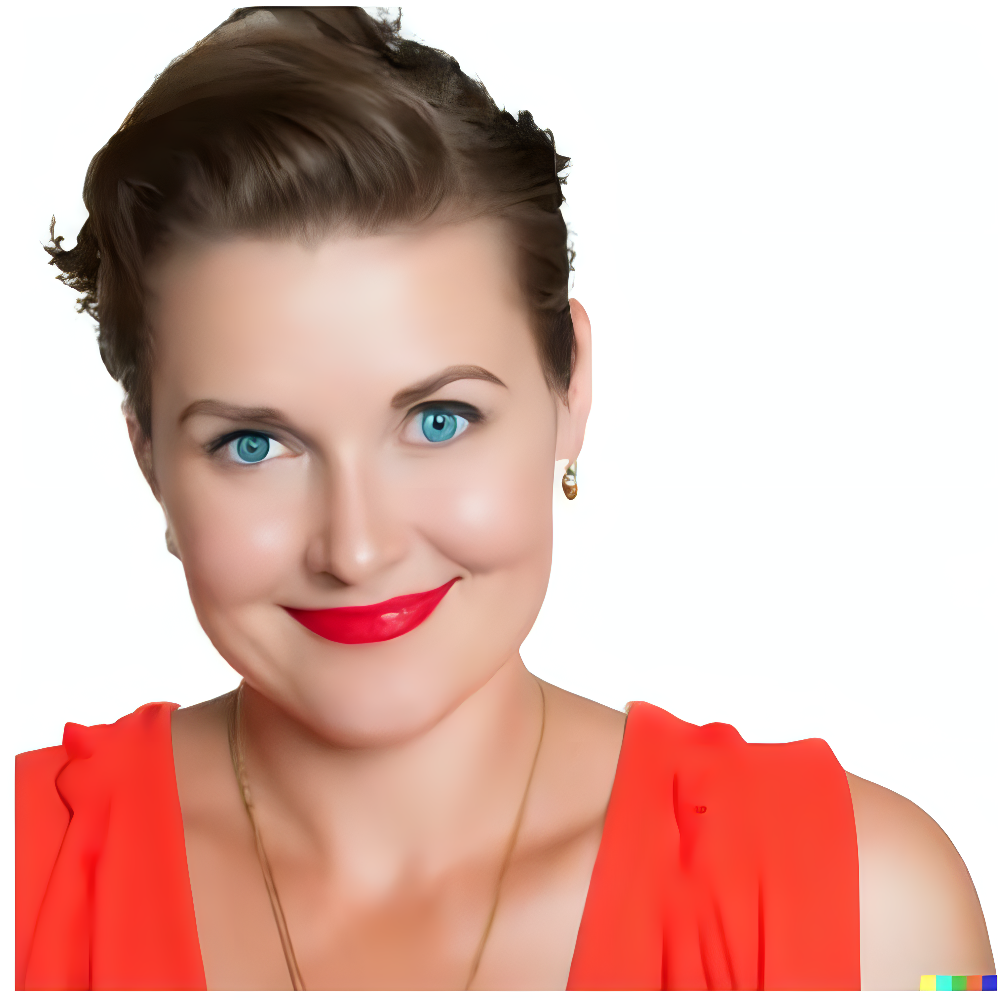

In [13]:
sr_image

In [14]:
def load_img_local(path_to_img):
  max_dim = 512
  img = tf.io.read_file(path_to_img)
  img = tf.image.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.float32)

  shape = tf.cast(tf.shape(img)[:-1], tf.float32)
  long_dim = max(shape)
  scale = max_dim / long_dim

  new_shape = tf.cast(shape * scale, tf.int32)

  img = tf.image.resize(img, new_shape)
  img = img[tf.newaxis, :]
  return img

In [15]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)

  plt.imshow(image)
  if title:
    plt.title(title)

In [16]:
# content_image = load_img(content_path)
# style_image = load_img(style_path)

# plt.subplot(1, 2, 1)
# imshow(content_image, 'Content Image')

# plt.subplot(1, 2, 2)
# imshow(style_image, 'Style Image')

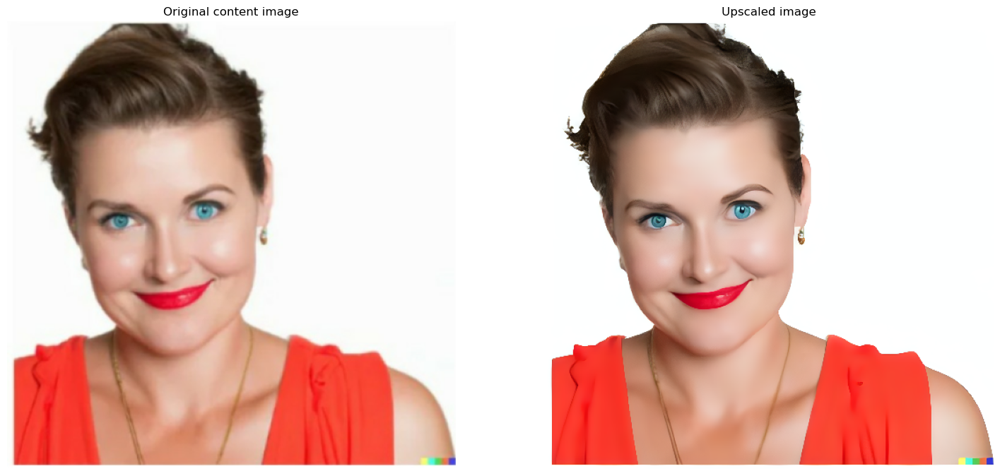

In [17]:
show_n([load_img_local('input_images/sample.jpg'),load_img_local('output_images/sr_image.png')],
       titles=['Original content image', 'Upscaled image'])

In [18]:
content_images['sea_turtle']

<tf.Tensor: shape=(1, 288, 384, 3), dtype=float32, numpy=
array([[[[0.        , 0.37703082, 0.4824587 ],
         [0.        , 0.39834902, 0.49638823],
         [0.        , 0.40246412, 0.50050336],
         ...,
         [0.        , 0.42352945, 0.53333336],
         [0.        , 0.41794693, 0.5199078 ],
         [0.        , 0.41869557, 0.52065635]],

        [[0.        , 0.393796  , 0.4918352 ],
         [0.        , 0.3854984 , 0.48745918],
         [0.        , 0.3921569 , 0.49411768],
         ...,
         [0.        , 0.3992558 , 0.5067868 ],
         [0.        , 0.40332243, 0.5069487 ],
         [0.00241954, 0.40148455, 0.5087354 ]],

        [[0.        , 0.39481798, 0.4928572 ],
         [0.        , 0.39265683, 0.49069604],
         [0.00523459, 0.40523463, 0.50327384],
         ...,
         [0.        , 0.40488046, 0.5107628 ],
         [0.00221122, 0.39545405, 0.5190104 ],
         [0.00491731, 0.41276047, 0.5186428 ]],

        ...,

        [[0.8300042 , 0.77674323, 

In [19]:
content_image_size = 384
style_image_size = 256
content_images = {k: load_image_url(v, (content_image_size, content_image_size)) for k, v in content_urls.items()}
style_images = {k: load_image_url(v, (style_image_size, style_image_size)) for k, v in style_urls.items()}
style_images = {k: tf.nn.avg_pool(style_image, ksize=[3,3], strides=[1,1], padding='SAME') for k, style_image in style_images.items()}

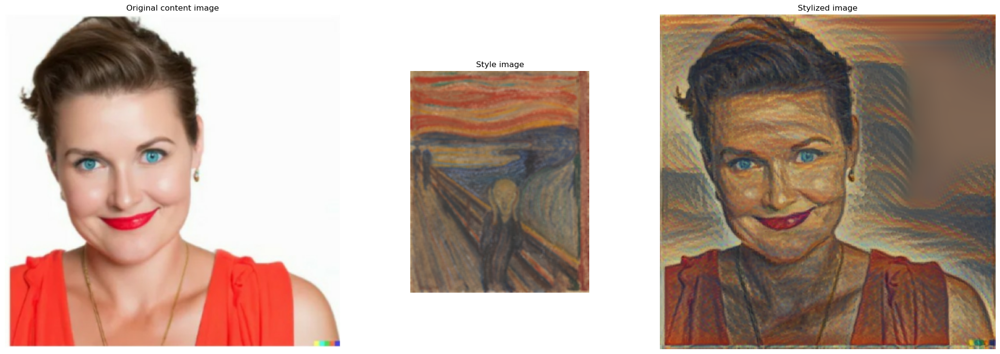

In [20]:
#@title Specify the main content image and the style you want to use.  { display-mode: "form" }

content_name = 'sea_turtle'  # @param ['sea_turtle', 'tuebingen', 'grace_hopper']
style_name = 'munch_scream'  # @param ['kanagawa_great_wave', 'kandinsky_composition_7', 'hubble_pillars_of_creation', 'van_gogh_starry_night', 'turner_nantes', 'munch_scream', 'picasso_demoiselles_avignon', 'picasso_violin', 'picasso_bottle_of_rum', 'fire', 'derkovits_woman_head', 'amadeo_style_life', 'derkovtis_talig', 'amadeo_cardoso']

stylized_image = hub_module(tf.constant(load_img_local('input_images/sample.jpg')),
                            tf.constant(style_images[style_name]))[0]

show_n([load_img_local('input_images/sample.jpg'), style_images[style_name], stylized_image],
       titles=['Original content image', 'Style image', 'Stylized image'])

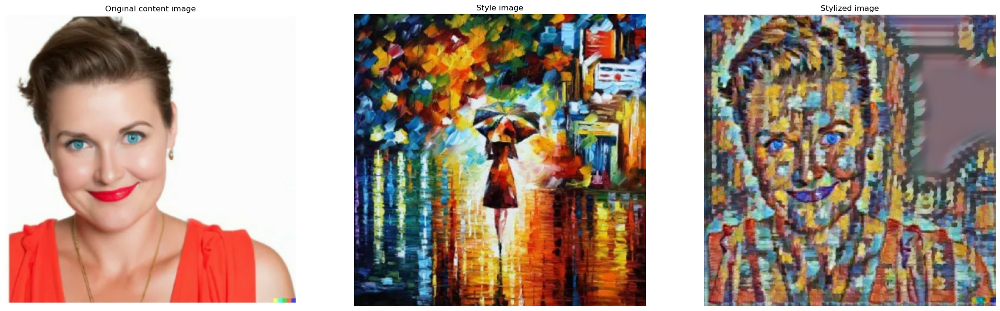

In [21]:
stylized_image = hub_module(tf.constant(load_img_local('input_images/sample.jpg')),
                            tf.constant(load_img_local('input_images/oil_painting.jpg')))[0]

show_n([load_img_local('input_images/sample.jpg'),
        load_img_local('input_images/oil_painting.jpg'),
        stylized_image],
       titles=['Original content image', 'Style image', 'Stylized image'])

In [22]:
stylized_image

<tf.Tensor: shape=(1, 512, 512, 3), dtype=float32, numpy=
array([[[[0.24495931, 0.2329841 , 0.36173955],
         [0.21664882, 0.19230253, 0.30100012],
         [0.2571408 , 0.23395012, 0.34507897],
         ...,
         [0.51050556, 0.4300029 , 0.44737378],
         [0.53095156, 0.45534346, 0.47694775],
         [0.5187715 , 0.432956  , 0.48592508]],

        [[0.2835844 , 0.2683892 , 0.41244367],
         [0.2483643 , 0.22054152, 0.33778644],
         [0.297396  , 0.2711136 , 0.39041734],
         ...,
         [0.51261026, 0.4449555 , 0.45453596],
         [0.5346903 , 0.47127712, 0.48402172],
         [0.5223153 , 0.44424307, 0.49542892]],

        [[0.26917967, 0.24883956, 0.37691295],
         [0.23211038, 0.20354342, 0.3052456 ],
         [0.26550668, 0.24249911, 0.34064364],
         ...,
         [0.49717018, 0.4310093 , 0.42939764],
         [0.5221131 , 0.4567701 , 0.45799538],
         [0.50037134, 0.427474  , 0.45923406]],

        ...,

        [[0.5070141 , 0.6539328 , 

In [23]:
import PIL.Image

In [24]:
def tensor_to_image(tensor):
  tensor = tensor*255
  tensor = np.array(tensor, dtype=np.uint8)
  if np.ndim(tensor)>3:
    assert tensor.shape[0] == 1
    tensor = tensor[0]
  return PIL.Image.fromarray(tensor)

In [25]:
file_name = 'output_images/stylized-image.png'
tensor_to_image(stylized_image).save(file_name)

In [26]:
path_to_image = 'input_images/sample.jpg'
def img_upscale(path_to_image):
    import os
    import torch
    from PIL import Image
    import numpy as np
    from RealESRGAN import RealESRGAN

    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = RealESRGAN(device, scale=4)
    model.load_weights('weights/RealESRGAN_x4.pth', download=True)

    image = Image.open(path_to_image).convert('RGB')

    sr_image = model.predict(image)

    path = path_to_image

    # Split directory and filename
    dir_name, file_name = os.path.split(path)


    sr_image.save(f'output_images/upscale-{file_name}')


In [27]:
img_upscale('output_images/stylized-image.png')

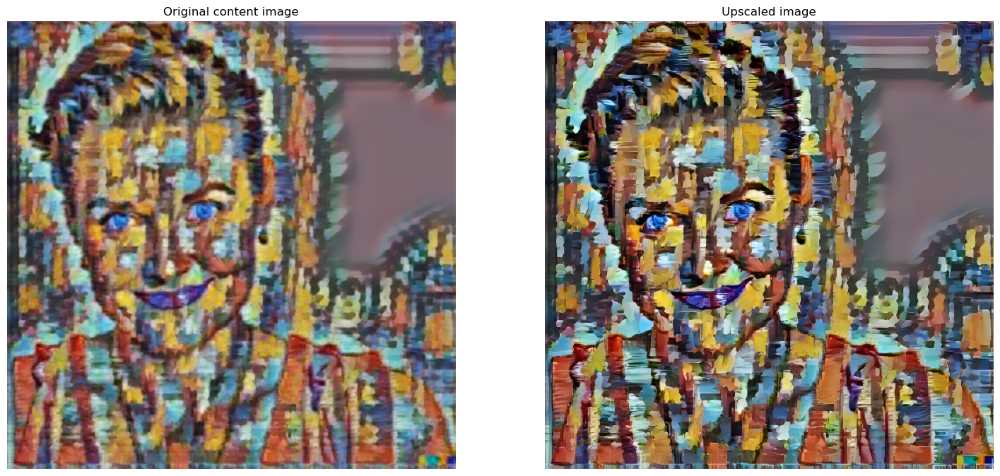

In [28]:
show_n([load_img_local('output_images/stylized-image.png'),load_img_local('output_images/upscale-stylized-image.png')],
       titles=['Original content image', 'Upscaled image'])

In [29]:
import os
path_to_image = 'input_images/sample.jpg'
path = path_to_image

# Split directory and filename
dir_name, file_name = os.path.split(path)
print("Directory:", dir_name)
print("Filename:", file_name)

Directory: input_images
Filename: sample.jpg


In [30]:
w,h=9933//sr_image.size[0],14043//sr_image.size[1]


In [31]:
A0_target_size = (9933,14043)  # For A0 at 300 DPI
final_image = sr_image.resize((sr_image.size[1]*h,sr_image.size[0]*w), Image.LANCZOS,)
final_image.save('output_images/final_output_a0.png')


| Size      | Inches      | Pixels (at 300 DPI) |
| --------- | ----------- | ------------------- |
| A1        | 23.4 × 33.1 | 7016 × 9933         |
| A0        | 33.1 × 46.8 | 9933 × 14043        |
| 4ft x 4ft | 48 × 48     | 14400 × 14400       |


In [32]:
from PIL import Image

def resize_with_aspect_ratio(image, target_size):
    target_width, target_height = target_size
    original_width, original_height = image.size

    # Compute scale factors
    scale_w = target_width / original_width
    scale_h = target_height / original_height

    # Choose the smaller scale to fit within the target size
    scale = min(scale_w, scale_h)

    # Calculate new size
    new_width = int(original_width * scale)
    new_height = int(original_height * scale)

    # Resize using high-quality filter
    resized_image = image.resize((new_width, new_height), Image.LANCZOS)
    return resized_image




In [33]:
# Example usage
target_size = (14043, 9933)  # A0 at 300 DPI
final_image = resize_with_aspect_ratio(sr_image, target_size)
final_image.save('output_images/final_output_a0_aspect1.png')

In [39]:
def printing_image(path_to_image,target_size):
    image = Image.open(path_to_image).convert('RGB')
    final_image = resize_with_aspect_ratio(image, target_size)
    # Split directory and filename
    dir_name, file_name = os.path.split(path_to_image)
    target_size_code='custom'
    if target_size==(7016,9933):
        target_size_code='A1'
    elif target_size==(9933,14043):
        target_size_code='A0'
    elif target_size==(14400,14400):
        target_size_code='4f'
    else:
        target_size_code='custom'


    final_image.save(f'output_images/printing_image/print-{target_size_code}-{file_name}')


In [35]:
final_image = final_image.convert('CMYK')
final_image.save('output_images/final_output_cmyk.tif')


In [ ]:
path_to_image = 'output_images/final_output_a0_aspect1.png'
image = Image.open(path_to_image).convert('RGB')
image

In [37]:
A1=7016,9933
A0=9933,14043
FourFeet=14400,14400

In [40]:
printing_image(r'output_images\upscale-stylized-image.png',A1)